<a href="https://colab.research.google.com/github/raulbenitez/PIB/blob/main/espais_color_transformacions_subpixel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transformacions entre formats de píxel

Canviar de real a unsigned byte

In [24]:
from skimage.util import img_as_ubyte
image = np.array([0, 0.5, 1], dtype=float)
img_as_ubyte(image)


array([  0, 128, 255], dtype=uint8)

Reescalar intensitats a un determinat rang:

In [26]:
from skimage.exposure import rescale_intensity 
image = np.array([51, 102, 153], dtype=np.uint8)
rescale_intensity(image)


array([  0, 127, 255], dtype=uint8)

In [27]:
rescale_intensity(image, out_range=(0, 127)).astype(np.int8)

array([  0,  63, 127], dtype=int8)

Transformar de unit8 a real

In [25]:
from skimage.util import img_as_float
image = np.array([123, 12, 255], dtype=float)
img_as_float(image)

array([123.,  12., 255.])

In [ ]:
from skimage import data
from skimage.transform import rescale
image = data.coins()
image.dtype, image.min(), image.max(), image.shape

rescaled = rescale(image, 0.5)
(rescaled.dtype, np.round(rescaled.min(), 4),
 np.round(rescaled.max(), 4), rescaled.shape)

rescaled = rescale(image, 0.5, preserve_range=True)
(rescaled.dtype, np.round(rescaled.min()),
 np.round(rescaled.max()), rescaled.shape


# Operacions amb espais de color

Convertir de RGB a HSV

In [5]:
from skimage import data

img = data.astronaut()

import plotly.express as px
fig = px.imshow(img)
fig.show()

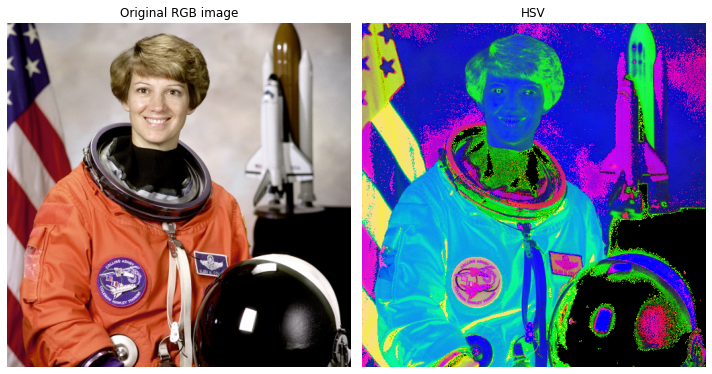

In [12]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from skimage.filters import gaussian
from skimage import img_as_ubyte
from skimage.color import convert_colorspace
import matplotlib.pyplot as plt

img_hsv = convert_colorspace(img, 'RGB', 'HSV')
img_ycbcr = convert_colorspace(img, 'RGB', 'YCbCr')


# Get some figures:
fig, axes = plt.subplots(1,2,figsize=(10, 7))
ax = axes.ravel()
ax[0].imshow(img,cmap=plt.cm.gray)
ax[0].set_title('Original RGB image') 
ax[1].imshow(img_hsv,cmap=plt.cm.jet)
ax[1].set_title('HSV') # set figure title
 
ax[0].set_axis_off()
ax[1].set_axis_off()
plt.tight_layout()
plt.show()

# Redimensionament d'imatges

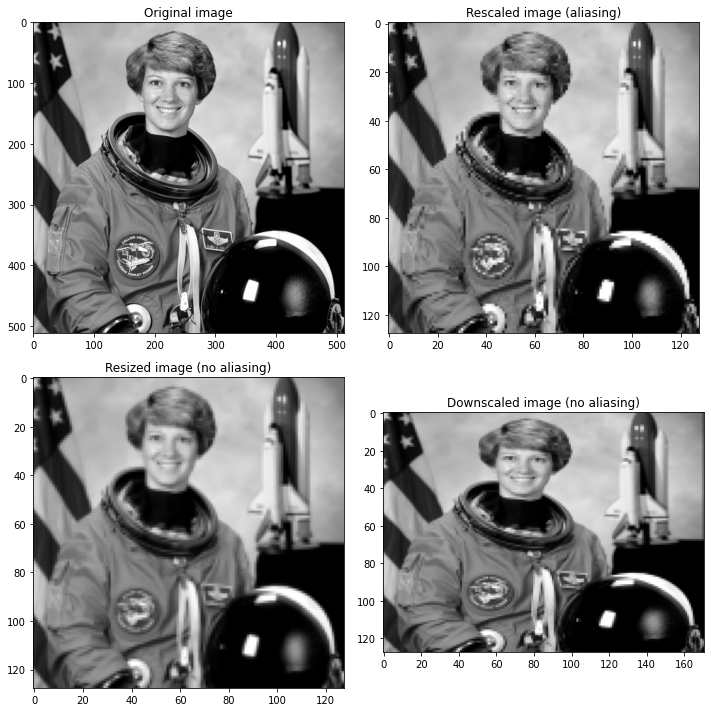

In [29]:
import matplotlib.pyplot as plt

from skimage import data, color
from skimage.transform import rescale, resize, downscale_local_mean

image = color.rgb2gray(data.astronaut())

image_rescaled = rescale(image, 0.25, anti_aliasing=False)
image_resized = resize(image, (image.shape[0] // 4, image.shape[1] // 4),
                       anti_aliasing=True)
image_downscaled = downscale_local_mean(image, (4, 3))

fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(10,10))

ax = axes.ravel()

ax[0].imshow(image, cmap='gray')
ax[0].set_title("Original image")

ax[1].imshow(image_rescaled, cmap='gray')
ax[1].set_title("Rescaled image (aliasing)")

ax[2].imshow(image_resized, cmap='gray')
ax[2].set_title("Resized image (no aliasing)")

ax[3].imshow(image_downscaled, cmap='gray')
ax[3].set_title("Downscaled image (no aliasing)")

ax[0].set_xlim(0, 512)
ax[0].set_ylim(512, 0)
plt.tight_layout()
plt.show()

# Transformacions geomètriques affins

In [30]:
from skimage import data
from skimage import transform
from skimage import img_as_float

tform = transform.EuclideanTransform(
   rotation=np.pi / 12.,
   translation = (100, -20)
   )
img = img_as_float(data.chelsea())
tf_img = transform.warp(img, tform.inverse)

fig = px.imshow(tf_img)
fig.show()

# Alineació canals de color (image registration)

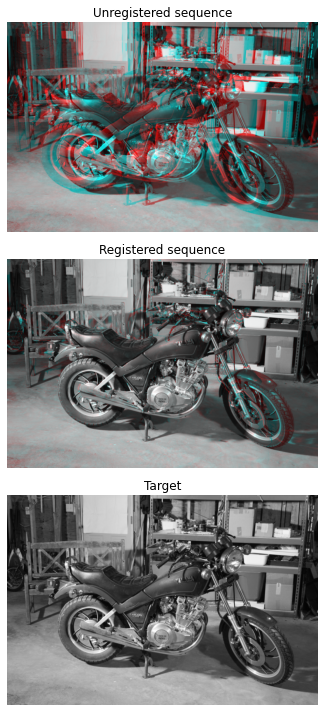

In [31]:
import numpy as np
from matplotlib import pyplot as plt
from skimage.color import rgb2gray
from skimage.data import stereo_motorcycle
from skimage.transform import warp
from skimage.registration import optical_flow_tvl1

# --- Load the sequence
image0, image1, disp = stereo_motorcycle()

# --- Convert the images to gray level: color is not supported.
image0 = rgb2gray(image0)
image1 = rgb2gray(image1)

# --- Compute the optical flow
v, u = optical_flow_tvl1(image0, image1)

# --- Use the estimated optical flow for registration

nr, nc = image0.shape

row_coords, col_coords = np.meshgrid(np.arange(nr), np.arange(nc),
                                     indexing='ij')

image1_warp = warp(image1, np.array([row_coords + v, col_coords + u]),
                   mode='nearest')

# build an RGB image with the unregistered sequence
seq_im = np.zeros((nr, nc, 3))
seq_im[..., 0] = image1
seq_im[..., 1] = image0
seq_im[..., 2] = image0

# build an RGB image with the registered sequence
reg_im = np.zeros((nr, nc, 3))
reg_im[..., 0] = image1_warp
reg_im[..., 1] = image0
reg_im[..., 2] = image0

# build an RGB image with the registered sequence
target_im = np.zeros((nr, nc, 3))
target_im[..., 0] = image0
target_im[..., 1] = image0
target_im[..., 2] = image0

# --- Show the result

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(5, 10))

ax0.imshow(seq_im)
ax0.set_title("Unregistered sequence")
ax0.set_axis_off()

ax1.imshow(reg_im)
ax1.set_title("Registered sequence")
ax1.set_axis_off()

ax2.imshow(target_im)
ax2.set_title("Target")
ax2.set_axis_off()

fig.tight_layout()